## Image Transformation and Stitching

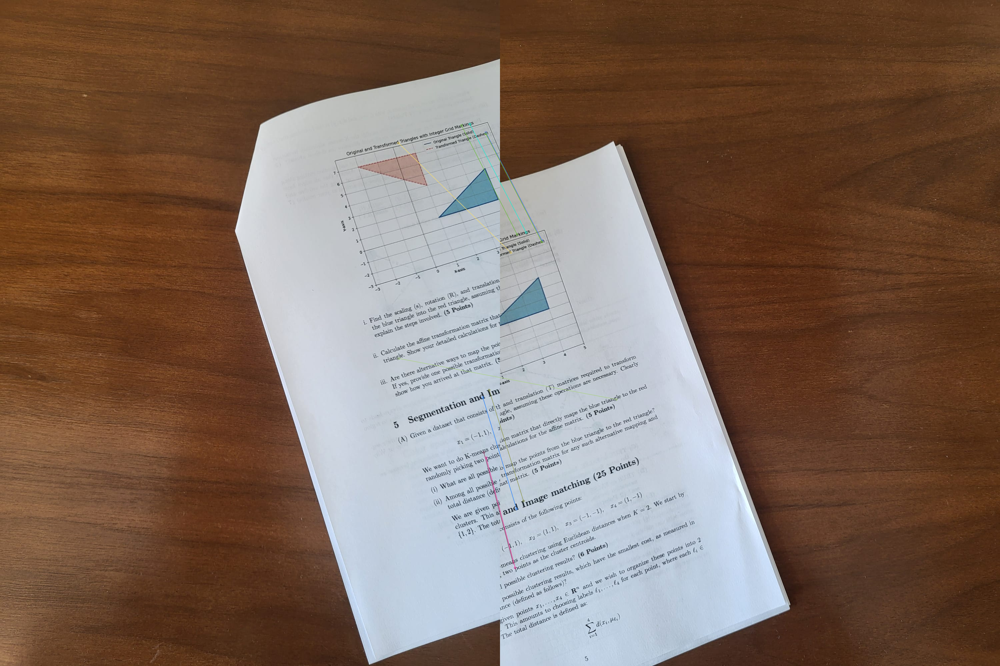

Homography Matrix:
 [[ 9.13855269e-01  4.43415257e-02  1.28147820e+03]
 [ 3.54175504e-02  9.45557789e-01 -2.97390731e+02]
 [-3.47462159e-05 -2.32482468e-05  1.00000000e+00]]


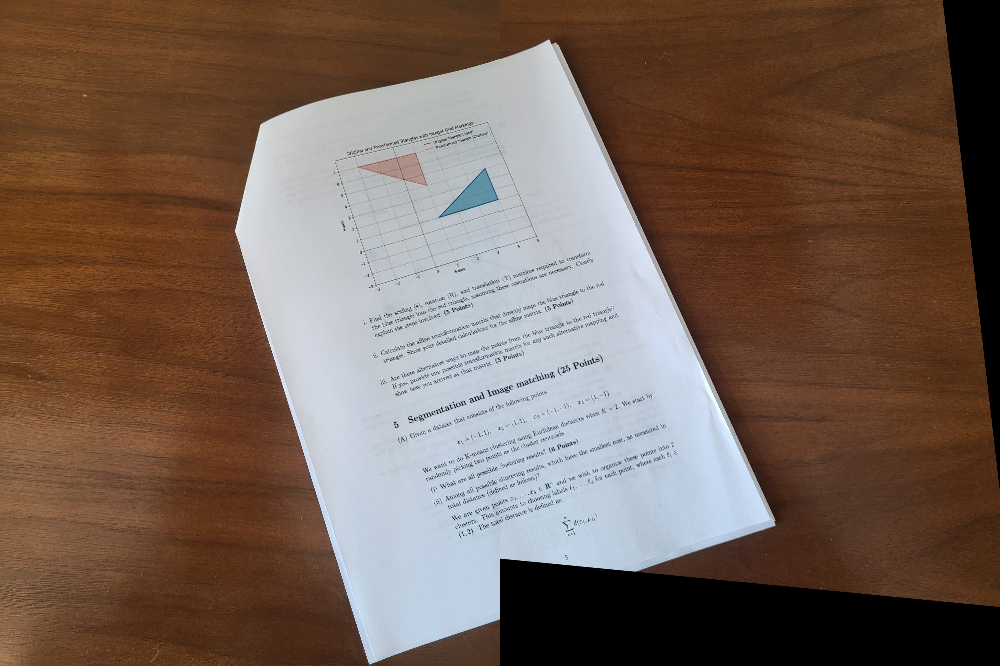

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image1 = cv2.imread('1.jpeg')
image2 = cv2.imread('3.jpeg')

g1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
g2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# ORB detector
orb = cv2.ORB_create(nfeatures=5000)

# To Detect keypoints and descriptors
k1, d1 = orb.detectAndCompute(g1, None)
k2, d2 = orb.detectAndCompute(g2, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(d1, d2, k=2)

# A ratio test to filter out poor matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

matches_img = cv2.drawMatches(image1, k1, image2, k2, good_matches[:10], None,
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(matches_img)

# Location of good matches
points1 = np.float32([k1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
points2 = np.float32([k2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# if we have enough points for homography calculation, then goes to funtion
if len(points1) >= 4 and len(points2) >= 4:
    def compute_homography(pts_src, pts_dst, threshold=5.0, confidence=0.995):
        best_H = None
        best_inliers = 0
        num_trials = 1000
        for _ in range(num_trials):
            idx = np.random.choice(pts_src.shape[0], 4, replace=False)
            src_pts = pts_src[idx].reshape(4, 2)
            dst_pts = pts_dst[idx].reshape(4, 2)

            H = compute_homography_from_points(src_pts, dst_pts)

            inliers = count_inliers(pts_src, pts_dst, H, threshold)

            if inliers > best_inliers:
                best_inliers = inliers
                best_H = H

        return best_H

    def compute_homography_from_points(src_pts, dst_pts):
        A = np.zeros((8, 9))
        for i in range(4):
            x, y = src_pts[i]
            u, v = dst_pts[i]
            A[2*i] = [x, y, 1, 0, 0, 0, -u*x, -u*y, -u]
            A[2*i+1] = [0, 0, 0, x, y, 1, -v*x, -v*y, -v]

        U, S, Vt = np.linalg.svd(A)
        H = Vt[-1].reshape(3, 3)
        return H / H[2, 2]

    def count_inliers(pts_src, pts_dst, H, threshold):
        inliers = 0
        for i in range(pts_src.shape[0]):
            src_pt = np.array([pts_src[i, 0, 0], pts_src[i, 0, 1], 1])
            dst_pt = np.dot(H, src_pt)
            dst_pt /= dst_pt[2]
            dst_pt = np.array([dst_pt[0], dst_pt[1]])
            error = np.linalg.norm(dst_pt - pts_dst[i, 0, :])
            if error < threshold:
                inliers += 1
        return inliers

    H = compute_homography(points2, points1)

    print("Homography Matrix:\n", H)

    height1, width1 = image1.shape[:2]
    height2, width2 = image2.shape[:2]

    # Creating a large enough canvas to hold both images
    result_width = width1 + width2
    result_height = max(height1, height2)
    result = cv2.warpPerspective(image2, H, (result_width, result_height))

    result[0:height1, 0:width1] = image1

    # To crop out black areas
    gray_result = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_result, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])
    final_result = result[y:y+h, x:x+w]

    cv2_imshow(final_result)

else:
    print("Not enough good matches were found.")

## Hough Transformation

### Marking the Runway for Landing

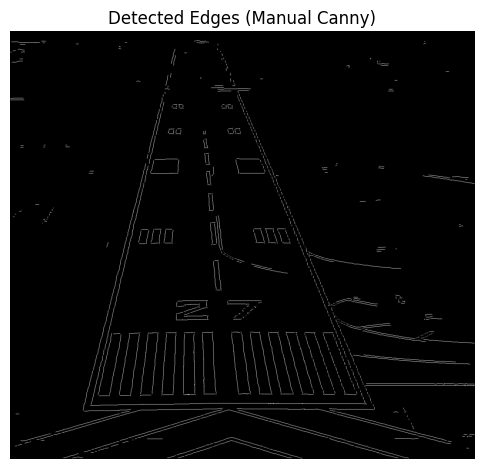

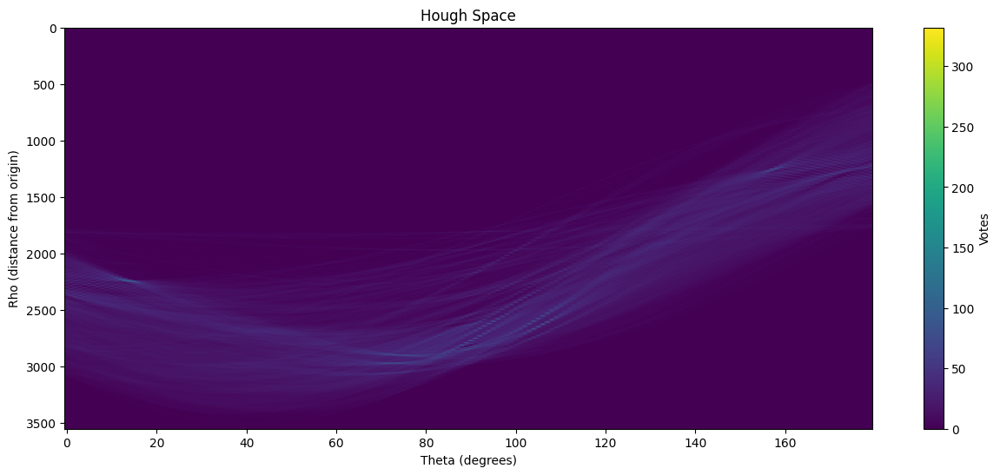

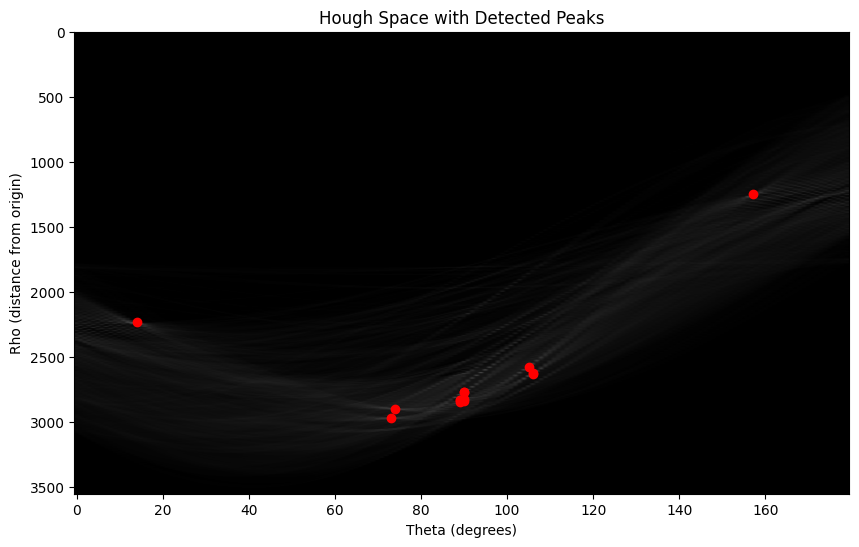

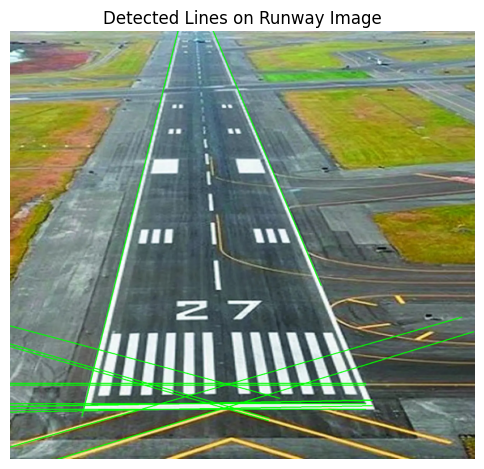

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

image_path = "runway.jpeg"
image = cv.imread(image_path)
gray_img = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Gaussian Blur to smooth the image
def apply_gaussian_blur(img, kernel_size=5, sigma=1.4):
    return cv.GaussianBlur(img, (kernel_size, kernel_size), sigma)

smoothed_img = apply_gaussian_blur(gray_img)

# Compute gradients using Sobel filters
def image_gradients(img):
    grad_x = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
    grad_y = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(grad_x**2 + grad_y**2)
    ang = np.arctan2(grad_y, grad_x)
    mag = mag / mag.max() * 255
    return mag, ang

magnitude, angle = image_gradients(smoothed_img)

# Non-Maximum Suppression
def nms(mag, ang):
    suppressed = np.zeros_like(mag)
    ang = ang * 180 / np.pi
    ang[ang < 0] += 180

    for i in range(1, mag.shape[0] - 1):
        for j in range(1, mag.shape[1] - 1):
            q, r = 255, 255
            if (0 <= ang[i, j] < 22.5) or (157.5 <= ang[i, j] <= 180):
                q = mag[i, j + 1]
                r = mag[i, j - 1]
            elif 22.5 <= ang[i, j] < 67.5:
                q = mag[i + 1, j - 1]
                r = mag[i - 1, j + 1]
            elif 67.5 <= ang[i, j] < 112.5:
                q = mag[i + 1, j]
                r = mag[i - 1, j]
            elif 112.5 <= ang[i, j] < 157.5:
                q = mag[i - 1, j - 1]
                r = mag[i + 1, j + 1]

            if mag[i, j] >= q and mag[i, j] >= r:
                suppressed[i, j] = mag[i, j]
            else:
                suppressed[i, j] = 0
    return suppressed

nms_img = nms(magnitude, angle)

# Hysteresis Thresholding
def threshold_edges(img, low_thresh=50, high_thresh=100):
    strong = 255
    weak = 75
    result = np.zeros_like(img)

    strong_i, strong_j = np.where(img >= high_thresh)
    weak_i, weak_j = np.where((img < high_thresh) & (img >= low_thresh))

    result[strong_i, strong_j] = strong
    result[weak_i, weak_j] = weak

    for i in range(1, img.shape[0] - 1):
        for j in range(1, img.shape[1] - 1):
            if result[i, j] == weak:
                if np.any(result[i-1:i+2, j-1:j+2] == strong):
                    result[i, j] = strong
                else:
                    result[i, j] = 0
    return result

edges_detected = threshold_edges(nms_img)

# Edges-detected image
plt.figure(figsize=(6, 6))
plt.imshow(edges_detected, cmap='gray')
plt.title('Detected Edges')
plt.axis('off')
plt.show()

# Defining Hough space
diag_len = int(np.sqrt(edges_detected.shape[0]**2 + edges_detected.shape[1]**2))
hough_accumulator = np.zeros((2 * diag_len, 180), dtype=np.uint64)

# Theta values
theta_vals = np.deg2rad(np.arange(0, 180))

# Locations of edge pixels
edge_pixels = np.argwhere(edges_detected > 0)

# Hough Transform
for y, x in edge_pixels:
    for idx, theta in enumerate(theta_vals):
        rho = int(x * np.cos(theta) + y * np.sin(theta)) + diag_len
        hough_accumulator[rho, idx] += 1

# Hough Transform space
plt.figure(figsize=(15, 6))
plt.imshow(hough_accumulator, cmap='viridis', aspect='auto')
plt.title('Hough Space')
plt.xlabel('Theta (degrees)')
plt.ylabel('Rho (distance from origin)')
plt.colorbar(label='Votes')
plt.show()

# Extract peaks from the Hough Space
vote_threshold = 200
peaks_in_hough = np.argwhere(hough_accumulator > vote_threshold)

# Peaks in Hough Space
plt.figure(figsize=(10, 6))
plt.imshow(hough_accumulator, cmap='gray', aspect='auto')
plt.scatter(peaks_in_hough[:, 1], peaks_in_hough[:, 0], color='red')
plt.title('Hough Space with Detected Peaks')
plt.xlabel('Theta (degrees)')
plt.ylabel('Rho (distance from origin)')
plt.show()


line_image = np.copy(image)

for rho, theta_idx in peaks_in_hough:
    theta = theta_vals[theta_idx]
    rho -= diag_len
    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)
    x0 = cos_theta * rho
    y0 = sin_theta * rho

    x1 = int(x0 + 1000 * (-sin_theta))
    y1 = int(y0 + 1000 * (cos_theta))
    x2 = int(x0 - 1000 * (-sin_theta))
    y2 = int(y0 - 1000 * (cos_theta))

    # Draws Line in green
    cv.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(6, 6))
plt.imshow(cv.cvtColor(line_image, cv.COLOR_BGR2RGB))
plt.title('Detected Lines on Runway Image')
plt.axis('off')
plt.show()


### Marking Circles for Rocket Landing

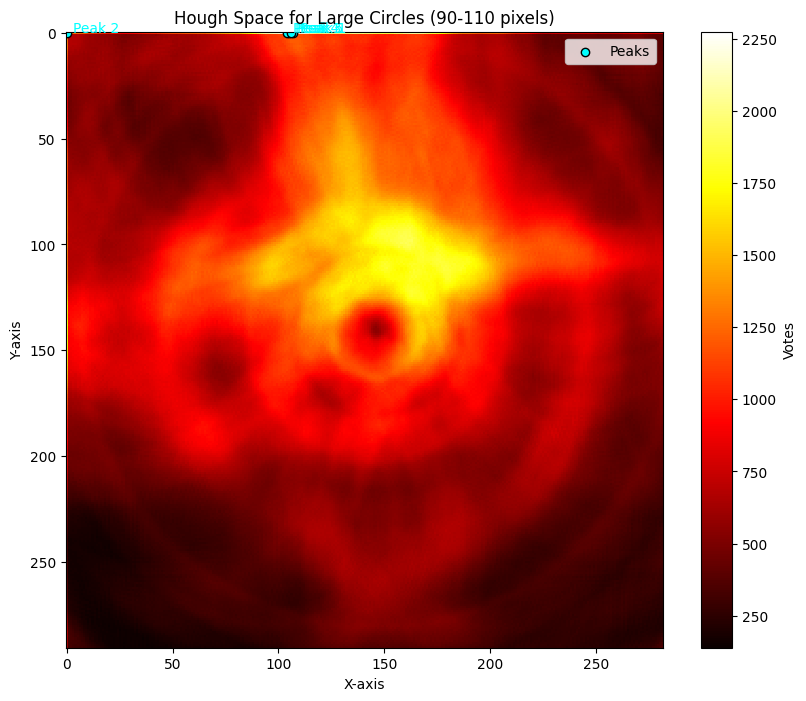

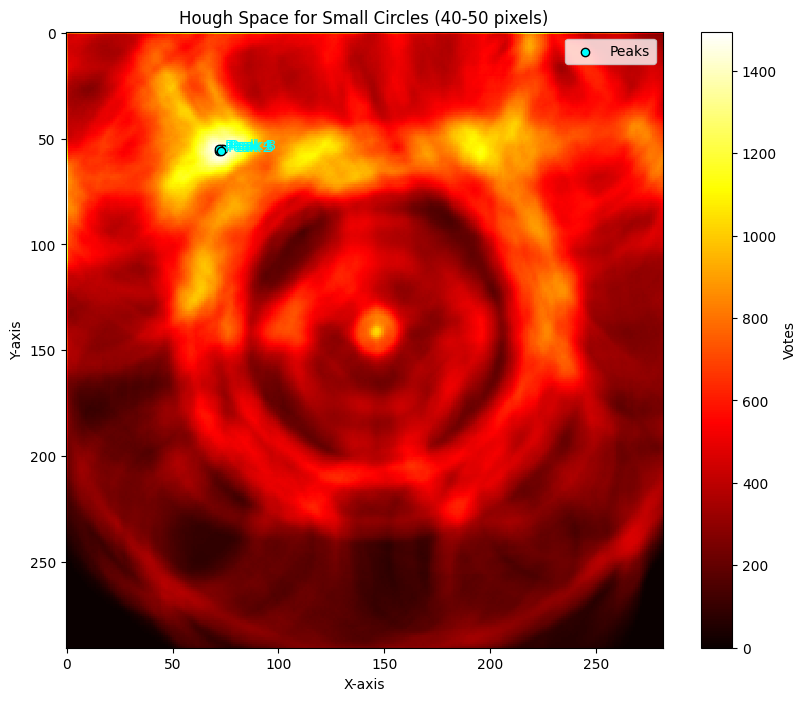

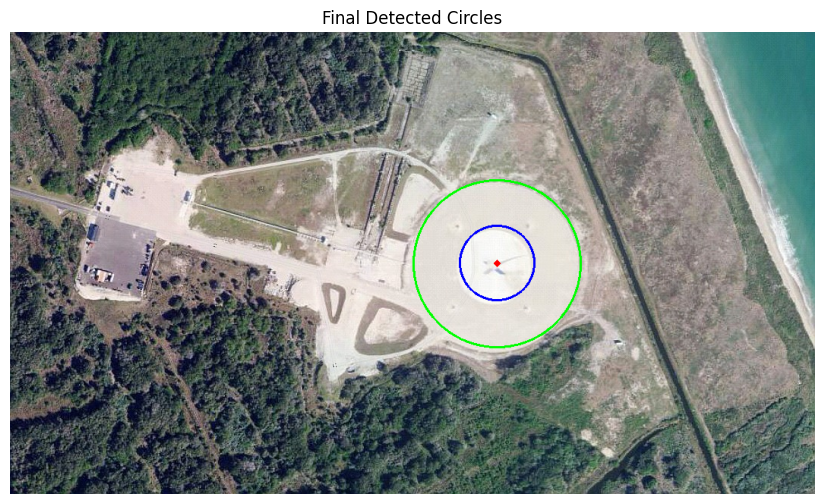

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def generate_gaussian_kernel(size, sigma):
    center = size // 2
    y, x = np.ogrid[:size, :size]
    kernel = np.exp(-((x - center)**2 + (y - center)**2) / (2 * sigma**2))
    return kernel / kernel.sum()

def gaussian_blur(img, kernel_size, sigma):
    kernel = generate_gaussian_kernel(kernel_size, sigma)
    return cv.filter2D(img, -1, kernel)

def median_blur(img, kernel_size):
    return cv.medianBlur(img, kernel_size)

def histogram_equalization(img):
    return cv.equalizeHist(img)

def compute_gradient_magnitude(img):
    sobel_x = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
    sobel_y = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    return np.uint8((gradient_magnitude / gradient_magnitude.max()) * 255)

def hysteresis_threshold(img, low_threshold, high_threshold):
    result = np.zeros_like(img, dtype=np.uint8)
    strong = 255
    weak = 75

    strong_pixels = img >= high_threshold
    weak_pixels = (img >= low_threshold) & (img < high_threshold)

    result[strong_pixels] = strong
    result[weak_pixels] = weak

    for y, x in zip(*np.where(result == weak)):
        if np.any(result[max(0, y-1):y+2, max(0, x-1):x+2] == strong):
            result[y, x] = strong
        else:
            result[y, x] = 0
    return result

# Circle Detection
def find_strongest_circle(edge_img, radius_range, threshold, theta_step=1):
    height, width = edge_img.shape
    radii = np.arange(radius_range[0], radius_range[1] + 1)
    acc = np.zeros((height, width, len(radii)), dtype=np.int32)

    edge_points = np.column_stack(np.where(edge_img > 0))
    for x, y in edge_points:
        for idx, r in enumerate(radii):
            angles = np.deg2rad(np.arange(0, 360, theta_step))
            a = (x - r * np.cos(angles)).astype(int)
            b = (y - r * np.sin(angles)).astype(int)
            valid_points = (a >= 0) & (a < width) & (b >= 0) & (b < height)
            acc[b[valid_points], a[valid_points], idx] += 1

    max_loc = np.unravel_index(np.argmax(acc), acc.shape)
    votes = acc[max_loc]
    if votes >= threshold:
        return [(max_loc[1], max_loc[0], radii[max_loc[2]])], acc
    return [], acc

def draw_circles(img, circles, color):
    for x, y, r in circles:
        cv.circle(img, (x, y), r, color, 2)
        cv.circle(img, (x, y), 2, (0, 0, 255), 3)

def show_hough_space(accumulator, title, peak_count=5):
    acc_2d = np.sum(accumulator, axis=2)

    plt.figure(figsize=(10, 8))
    plt.imshow(acc_2d, cmap='hot', interpolation='nearest')
    plt.colorbar(label="Votes")
    plt.title(title)
    plt.xlabel("X-axis")
    plt.ylabel("Y-axis")

    top_peaks = np.argsort(acc_2d.ravel())[-peak_count:]
    y_peaks, x_peaks = np.unravel_index(top_peaks, acc_2d.shape)
    plt.scatter(x_peaks, y_peaks, c='cyan', label="Peaks", edgecolor='black')

    for i, (x, y) in enumerate(zip(x_peaks, y_peaks)):
        plt.text(x + 3, y, f"Peak {i+1}", color='cyan')

    plt.legend()
    plt.show()

image_path = "SpaceXmap.jpg"
original_image = cv.imread(image_path)
gray_img = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)

# ROI
region_of_interest = gray_img[163:454, 495:777]
equalized_img = histogram_equalization(region_of_interest)
blurred_img = gaussian_blur(equalized_img, 5, 1.4)
smoothed_img = median_blur(blurred_img, 5)
gradient_img = compute_gradient_magnitude(smoothed_img)
edge_img = hysteresis_threshold(gradient_img, 30, 80)

# Detect circles
output_img = original_image.copy()
roi_output = output_img[163:454, 495:777]
big_circles, hough_large = find_strongest_circle(edge_img, (90, 110), 100)
small_circles, hough_small = find_strongest_circle(edge_img, (40, 50), 150)

# Annotate circles
draw_circles(roi_output, big_circles, (0, 255, 0))  # Green for larger circles
draw_circles(roi_output, small_circles, (255, 0, 0))  # Red for smaller circles

# Hough spaces
show_hough_space(hough_large, "Hough Space for Large Circles (90-110 pixels)")
show_hough_space(hough_small, "Hough Space for Small Circles (40-50 pixels)")

# Display final result
plt.figure(figsize=(12, 6))
plt.imshow(cv.cvtColor(output_img, cv.COLOR_BGR2RGB))
plt.title("Final Detected Circles")
plt.axis("off")
plt.show()


## Image Segmentation

### Mean Shift Segmentation

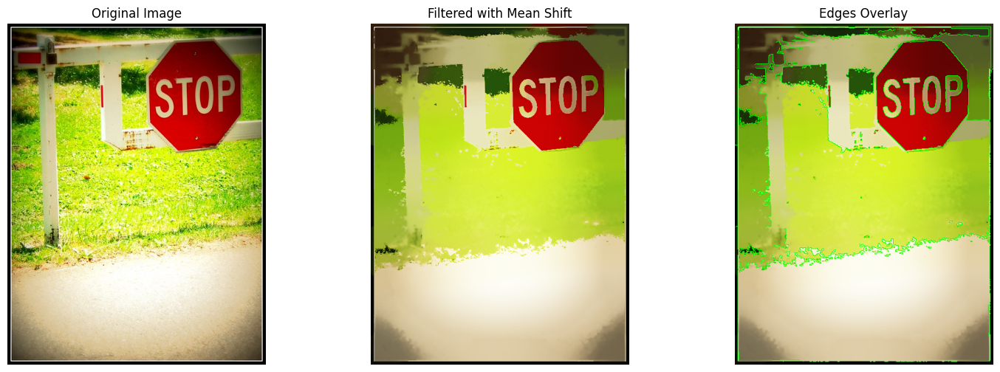

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Mean shift filtering
def apply_mean_shift(image, sp_radius, clr_radius):
    return cv2.pyrMeanShiftFiltering(image, sp=sp_radius, sr=clr_radius)

# To detect edges using Canny edge detector
def detect_edges(image):
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Canny(gray_img, 50, 150)

# To overlay edges onto the filtered image
def overlay_edges(filtered_img, edges):
    overlay = filtered_img.copy()
    overlay[edges > 0] = [0, 255, 0]
    return overlay


img_path = 'stop.jpg'
original_img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

spatial_radius = 40
color_radius = 80

# Mean shift filtering
filtered_img = apply_mean_shift(original_img, spatial_radius, color_radius)

# Detect edges
edges_img = detect_edges(filtered_img)

# Overlay with detected edges
result_img = overlay_edges(filtered_img, edges_img)

# Plotting the images
fig = plt.figure(figsize=(18, 6))

fig.add_subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis("off")

fig.add_subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(filtered_img, cv2.COLOR_BGR2RGB))
plt.title("Filtered with Mean Shift")
plt.axis("off")

fig.add_subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Edges Overlay")
plt.axis("off")

plt.show()


### Normalized Graph Cut Segmentation

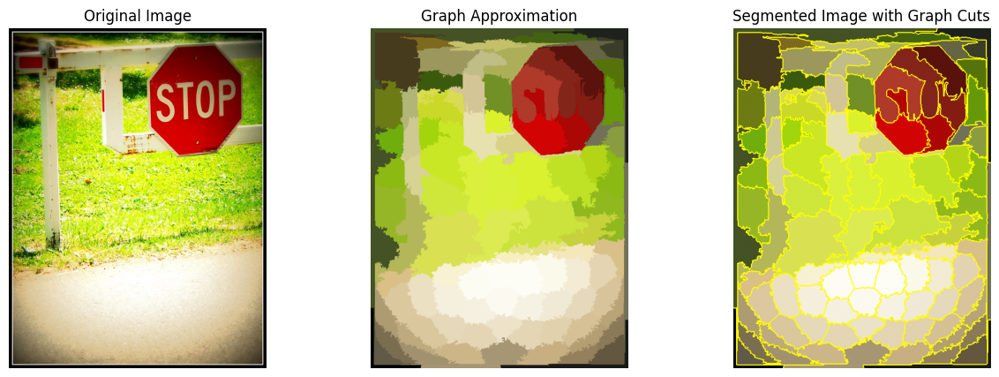

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries
from sklearn.cluster import SpectralClustering
from scipy.spatial.distance import cdist

input_image = 'stop.jpg'
img = cv2.imread(input_image)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# To generate superpixels using SLIC
total_segments = 150
compact_val = 10
superpixel_labels = slic(img_rgb, n_segments=total_segments, compactness=compact_val, start_label=1)

# Computing mean color for each superpixel
segments_list = np.unique(superpixel_labels)
avg_colors = []
for seg in segments_list:
    seg_mask = (superpixel_labels == seg)
    avg_color = img_rgb[seg_mask].mean(axis=0)
    avg_colors.append(avg_color)
avg_colors = np.array(avg_colors)

# Affinity matrix based on color similarity
dist_matrix = cdist(avg_colors, avg_colors, metric='euclidean')
affinity_mat = np.exp(-dist_matrix / dist_matrix.std())

# Spectral clustering
cluster_count = 5
clustering_model = SpectralClustering(n_clusters=cluster_count, affinity='precomputed')
cluster_labels = clustering_model.fit_predict(affinity_mat)

# Segmented output image
segmented_output = np.zeros_like(img_rgb)
for i, seg in enumerate(segments_list):
    seg_mask = (superpixel_labels == seg)
    segmented_output[seg_mask] = avg_colors[i]

# Boundaries/Graph Cuts
output_with_edges = mark_boundaries(segmented_output, superpixel_labels)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_rgb)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(segmented_output.astype(np.uint8))
axs[1].set_title('Graph Approximation')
axs[1].axis('off')

axs[2].imshow(output_with_edges)
axs[2].set_title('Segmented Image with Graph Cuts')
axs[2].axis('off')

plt.show()


## Comparision of Segmentation Algorithms using Classical Approachs

### Chosen Best Method

IoU Scores for Watershed Segmentation: [0.007169580597731938, 0.0030367689361113334, 0.005722917816576126, 0.11067712128720086, 0.07594761832049968, 0.06572311459639099, 0.1034510386621216, 8.675660434650588e-05]
Average IoU for Watershed Segmentation: 0.0465


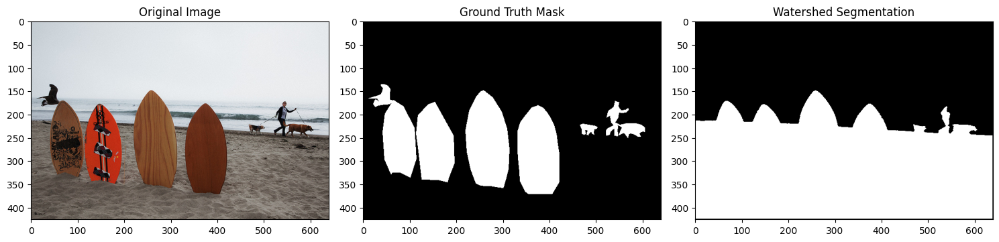

In [ ]:
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt

def load_annotations(json_path):
    with open(json_path, 'r') as f:
        return json.load(f)

def create_ground_truth_masks(annotations, image_shape):
    masks = []
    for ann in annotations:
        mask = np.zeros(image_shape[:2], dtype=np.uint8)
        seg_points = np.array(ann['segmentation']).reshape(-1, 2).astype(np.int32)
        cv2.fillPoly(mask, [seg_points], 255)
        masks.append(mask)
    return masks

# Watershed Function
def apply_watershed(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(image, markers)
    segmentation_result = np.zeros_like(gray)
    segmentation_result[markers > 1] = 255
    return segmentation_result

def calculate_iou(ground_truth_masks, segmented_result):
    ious = []
    for gt_mask in ground_truth_masks:
        intersection = np.logical_and(gt_mask > 0, segmented_result > 0)
        union = np.logical_or(gt_mask > 0, segmented_result > 0)
        iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
        ious.append(iou)
    avg_iou = np.mean(ious) if ious else 0
    return ious, avg_iou

def visualize_results(original_image, ground_truth_masks, watershed_result):
    combined_gt_mask = np.max(np.stack(ground_truth_masks), axis=0) if ground_truth_masks else None

    plt.figure(figsize=(15, 7))
    plt.subplot(131)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")

    plt.subplot(132)
    plt.imshow(combined_gt_mask, cmap="gray")
    plt.title("Ground Truth Mask")

    plt.subplot(133)
    plt.imshow(watershed_result, cmap="gray")
    plt.title("Watershed Segmentation")

    plt.tight_layout()
    plt.show()

def main():
    image_path = 'img2.jpg'
    original_image = cv2.imread(image_path)
    if original_image is None:
        raise ValueError("Image not found")

    annotations_json_path = 'annotations2.json'
    annotations_data = load_annotations(annotations_json_path)

    if len(annotations_data) == 0:
        raise ValueError("No annotations found")

    ground_truth_masks = create_ground_truth_masks(annotations_data, original_image.shape)

    watershed_result = apply_watershed(original_image)

    ious_watershed, avg_iou_watershed = calculate_iou(ground_truth_masks, watershed_result)
    print(f"IoU Scores for Watershed Segmentation: {ious_watershed}")
    print(f"Average IoU for Watershed Segmentation: {avg_iou_watershed:.4f}")

    visualize_results(original_image, ground_truth_masks, watershed_result)

if __name__ == "__main__":
    main()


### Comparison to other models

IoU Scores for Canny Edge Detection: [0.011262814324460994, 0.009642198799451718, 0.018427235454001014, 0.009579563597658328, 0.05322623650179976, 0.0744565999712106, 0.010763209393346379, 0.010353395913859746]
Average IoU for Canny Edge Detection: 0.0247
IoU Scores for K-means Segmentation: [0.0018003448118029386, 0.0008194335952457535, 0.0018523035643503978, 0.0001857712948947296, 0.0036678299266434014, 0.0002227811713977722, 0.0004432685514814866, 0.0011591638767930817]
Average IoU for K-means Segmentation: 0.0013
IoU Scores for Watershed Segmentation: [0.007169580597731938, 0.0030367689361113334, 0.005722917816576126, 0.11067712128720086, 0.07594761832049968, 0.06572311459639099, 0.1034510386621216, 8.675660434650588e-05]
Average IoU for Watershed Segmentation: 0.0465


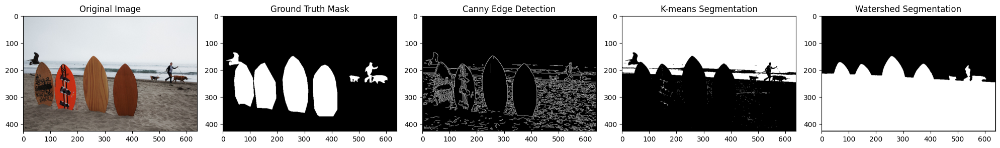

In [ ]:
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def load_annotations(json_path):
    """Load annotations from a JSON file."""
    with open(json_path, 'r') as f:
        return json.load(f)

def create_ground_truth_masks(annotations, image_shape):
    """Create binary masks from ground truth annotations."""
    masks = []
    for ann in annotations:
        mask = np.zeros(image_shape[:2], dtype=np.uint8)
        seg_points = np.array(ann['segmentation']).reshape(-1, 2).astype(np.int32)
        cv2.fillPoly(mask, [seg_points], 255)
        masks.append(mask)
    return masks

def canny_edge_detection(image):
    """Perform Canny edge detection."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    return edges

# K-Means Method
def kmeans_segmentation(image, k=2):
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    return segmented_image

def convert_to_binary_mask(segmented_image):
    gray = cv2.cvtColor(np.uint8(segmented_image), cv2.COLOR_BGR2GRAY)
    _, binary_mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary_mask

# Watershed Method
def apply_watershed(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(image, markers)
    segmentation_result = np.zeros_like(gray)
    segmentation_result[markers > 1] = 255
    return segmentation_result

# To calculate IoUs
def calculate_iou(ground_truth_masks, segmented_result):
    """Calculate IoU scores for each mask."""
    ious = []
    for gt_mask in ground_truth_masks:
        intersection = np.logical_and(gt_mask > 0, segmented_result > 0)
        union = np.logical_or(gt_mask > 0, segmented_result > 0)
        iou = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0
        ious.append(iou)
    avg_iou = np.mean(ious) if ious else 0
    return ious, avg_iou

def visualize_results(original_image, ground_truth_masks, edges_canny, kmeans_result_binary_mask, watershed_result):
    """Visualize segmentation results."""
    combined_gt_mask = np.max(np.stack(ground_truth_masks), axis=0) if ground_truth_masks else None

    plt.figure(figsize=(20, 10))
    plt.subplot(151)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")

    plt.subplot(152)
    plt.imshow(combined_gt_mask, cmap="gray")
    plt.title("Ground Truth Mask")

    plt.subplot(153)
    plt.imshow(edges_canny, cmap="gray")
    plt.title("Canny Edge Detection")

    plt.subplot(154)
    plt.imshow(kmeans_result_binary_mask, cmap="gray")
    plt.title("K-means Segmentation")

    plt.subplot(155)
    plt.imshow(watershed_result, cmap="gray")
    plt.title("Watershed Segmentation")

    plt.tight_layout()
    plt.show()

def main():
    image_path = 'img2.jpg'
    original_image = cv2.imread(image_path)
    if original_image is None:
        raise ValueError("Image not found")

    annotations_json_path = 'annotations2.json'
    annotations_data = load_annotations(annotations_json_path)

    if len(annotations_data) == 0:
        raise ValueError("No annotations found")

    ground_truth_masks = create_ground_truth_masks(annotations_data, original_image.shape)

    edges_canny = canny_edge_detection(original_image)
    kmeans_result = kmeans_segmentation(original_image)
    kmeans_result_binary_mask = convert_to_binary_mask(kmeans_result)
    watershed_result = apply_watershed(original_image)

    ious_canny, avg_iou_canny = calculate_iou(ground_truth_masks, edges_canny)
    ious_kmeans, avg_iou_kmeans = calculate_iou(ground_truth_masks, kmeans_result_binary_mask)
    ious_watershed, avg_iou_watershed = calculate_iou(ground_truth_masks, watershed_result)

    print(f"IoU Scores for Canny Edge Detection: {ious_canny}")
    print(f"Average IoU for Canny Edge Detection: {avg_iou_canny:.4f}")
    print(f"IoU Scores for K-means Segmentation: {ious_kmeans}")
    print(f"Average IoU for K-means Segmentation: {avg_iou_kmeans:.4f}")
    print(f"IoU Scores for Watershed Segmentation: {ious_watershed}")
    print(f"Average IoU for Watershed Segmentation: {avg_iou_watershed:.4f}")

    # Visualize results
    visualize_results(original_image, ground_truth_masks, edges_canny, kmeans_result_binary_mask, watershed_result)

if __name__ == "__main__":
    main()
